In [3]:
# Import libraries:

# For Warnings
import warnings
warnings.filterwarnings('ignore')

# Data handling libraries
import numpy as np
import pandas as pd

# Time for the control of the timing for proccesses
import time

# Data acquisition and saving files
import json
import os

# Data visualization
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt

In [82]:
# Vector to append all the information
all_info = []

# obtain the values
for i in range(1,24):
    try:
        if i<10:
            with open(f"./Datos_meteorologicos/04_21_2012_0{i}_f.json", 'r') as f:
                value = json.load(f)
            all_info.append(value)
        elif i>=10:
            with open(f"./Datos_meteorologicos/04_21_2012_{i}_f.json", 'r') as f:
                value = json.load(f)
            all_info.append(value)
    except:
        pass

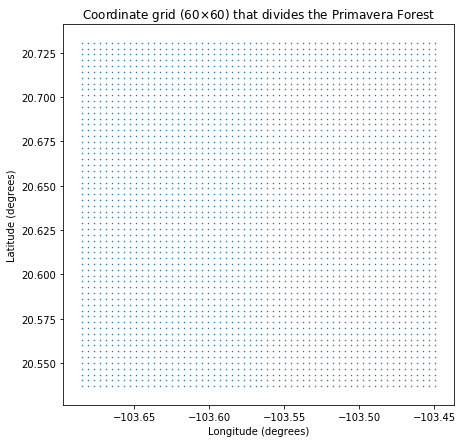

In [148]:
# Determine geospacial delimitations for the Primavera Forest 

# Delimitation coordinates
lat1, lon1 = 20.730654, -103.684725
lat2, lon2 = 20.536931, -103.684725
lat3, lon3 = 20.536931, -103.449552
lat4, lon4 = 20.730654, -103.449552

#Polygon
del_lat = [lat1,lat2,lat3,lat4]
del_lon = [lon1,lon2,lon3,lon4]

# Generate a grid for the data points:
lat_numbers = 60
lon_numbers = 60
lat_vector = np.linspace(min(del_lat), max(del_lat), lat_numbers)
lon_vector = np.linspace(min(del_lon), max(del_lon), lon_numbers)

# Meshgrid with the values
lon,lat = np.meshgrid(lon_vector,lat_vector)

# Have all the coordinates in a vector and in a dataframe
coordinates = [[lat,lon] for lat in lat_vector for lon in lon_vector]
coordinates_df = pd.DataFrame(coordinates, columns=['latitude','longitude'])

# Plot the figure
plt.figure(figsize=(7,7))
plt.scatter(lon,lat, s=.3)
plt.title(f'Coordinate grid ({lon_numbers}$\\times${lat_numbers}) that divides the Primavera Forest')
plt.xlabel('Longitude (degrees)')
plt.ylabel('Latitude (degrees)')
plt.show()

In [149]:
# Generate a list that will contain the dataframes
information0 = []

# Add latitude, longitude and time (hour), and then information
for alpha in range(len(all_info)):
    try:
        information = pd.DataFrame([all_info[alpha][i]['currently'] for i in range(len(all_info[0]))])
        information['longitude'] = coordinates_df.longitude
        information['latitude'] = coordinates_df.latitude
        information['time_alpha']= (alpha+1)*np.ones(3600)
        information0.append(information)
    except:
        pass

# Concatenate all the dataframes
information = pd.concat(information0, ignore_index=True)

In [150]:
information.head()

,apparentTemperature,cloudCover,dewPoint,humidity,icon,latitude,longitude,precipIntensity,precipProbability,pressure,summary,temperature,time,time_alpha,uvIndex,visibility,windBearing,windSpeed
0,80.59,0.44,21.21,0.11,partly-cloudy-day,20.536931,-103.684725,0,0,NaN,Partly Cloudy,80.59,1334970000,1.0,0,10.0,260.0,11.51
1,80.87,0.44,21.21,0.11,partly-cloudy-day,20.536931,-103.680739,0,0,NaN,Partly Cloudy,80.87,1334970000,1.0,0,10.0,260.0,11.51
2,81.10,0.44,21.21,0.11,partly-cloudy-day,20.536931,-103.676753,0,0,NaN,Partly Cloudy,81.10,1334970000,1.0,0,10.0,260.0,11.51
3,81.20,0.44,21.21,0.11,partly-cloudy-day,20.536931,-103.672767,0,0,NaN,Partly Cloudy,81.20,1334970000,1.0,0,10.0,260.0,11.51
4,81.21,0.44,21.21,0.11,partly-cloudy-day,20.536931,-103.668781,0,0,NaN,Partly Cloudy,81.21,1334970000,1.0,0,10.0,260.0,11.51


In [190]:
fig = go.Figure(data=[go.Heatmap(x=information[information['time_alpha']==1].longitude,
                                 y=information[information['time_alpha']==1].latitude,
                                 z=information[information['time_alpha']==1].temperature)],
                layout= go.Layout(title="Temperature", updatemenus=[dict(type="buttons", buttons=[dict(label="Play", method="animate", args=[None])])]),
                frames= [go.Frame(data=[go.Heatmap(x=information[information['time_alpha']==i+1].longitude,
                                                   y= information[information['time_alpha']==i+1].latitude, 
                                                   z=information[information['time_alpha']==i+1].temperature)]) for i in range(len(all_info))]
               )
fig.update_layout(width = 700, height = 700)

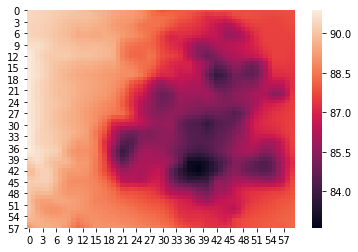

In [179]:
temperature = [np.array(np.split(np.array([all_info[alpha][i]['currently']['temperature'] for i in range(len(all_info[0]))]),60)) for alpha in range(len(all_info))]
temperature1 = list(reversed(temperature[20]))
sns.heatmap(temperature1)

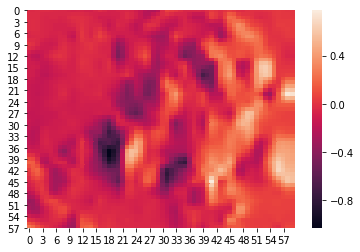

In [180]:
grad1 = np.gradient(temperature1)[1]
sns.heatmap(grad1)

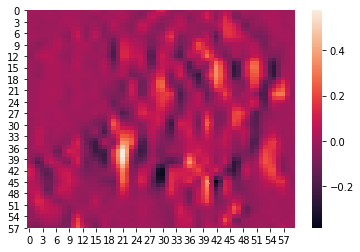

In [181]:
grad2=np.gradient(grad1)[1]
sns.heatmap(grad2)

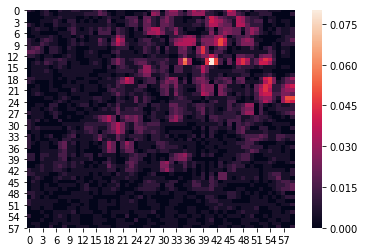

In [189]:
sns.heatmap(abs(np.gradient(list(reversed(temperature[3])))[1]-grad1), vmin=0)

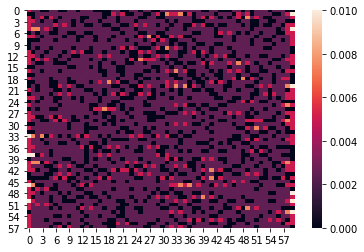

In [185]:
sns.heatmap(abs(np.gradient(np.gradient(list(reversed(temperature[21])))[1])[1]-np.gradient(grad1)[1]), vmin=0)